In [1]:
import jax
# jax.distributed.initialize()
import tensorflow_probability.substrates.jax as tfp

from gigalens.jax.inference import ModellingSequence
from gigalens.jax.model import ForwardProbModel, BackwardProbModel
from gigalens.model import PhysicalModel
from gigalens.jax.simulator import LensSimulator
from gigalens.simulator import SimulatorConfig
from gigalens.jax.profiles.mass import epl, shear

import os, sys
sys.path.insert(0, f'{os.environ['HOME']}/gigalens/src/gigalens_2/jax')
from profiles.light import sersic #evan's updated sersic b_n

from jax import random
import numpy as np
import optax
from jax import numpy as jnp
from matplotlib import pyplot as plt
import optax
import corner
import yaml
import pickle
import blackjax
import importlib
tfd = tfp.distributions
import os

import sys
sys.path.append('../nuts')
from mclmc_alt import MCLMC
from mams import MAMS

2026-07-01 16:49:27.265692: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1782949767.435421  436452 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1782949767.484870  436452 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1782949767.952287  436452 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1782949767.952306  436452 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1782949767.952310  436452 computation_placer.cc:177] computation placer alr

In [2]:
#* Define Priors
lens_prior = tfd.JointDistributionSequential(
    [
        tfd.JointDistributionNamed(
            dict(
                theta_E=tfd.LogNormal(jnp.log(1.25), 0.25),
                gamma=tfd.TruncatedNormal(2, 0.25, 1, 3),
                e1=tfd.Normal(0, 0.1),
                e2=tfd.Normal(0, 0.1),
                center_x=tfd.Normal(0, 0.05),
                center_y=tfd.Normal(0, 0.05),
            )
        ),
        tfd.JointDistributionNamed(
            dict(gamma1=tfd.Normal(0, 0.05), gamma2=tfd.Normal(0, 0.05))
        ),
    ]
)
lens_light_prior = tfd.JointDistributionSequential(
    [
        tfd.JointDistributionNamed(
            dict(
                R_sersic=tfd.LogNormal(jnp.log(1.0), 0.15),
                n_sersic=tfd.Uniform(2, 6),
                e1=tfd.TruncatedNormal(0, 0.1, -0.3, 0.3),
                e2=tfd.TruncatedNormal(0, 0.1, -0.3, 0.3),
                center_x=tfd.Normal(0, 0.05),
                center_y=tfd.Normal(0, 0.05),
                Ie=tfd.LogNormal(jnp.log(500.0), 0.3),
            )
        )
    ]
)

source_light_prior = tfd.JointDistributionSequential(
    [
        tfd.JointDistributionNamed(
            dict(
                R_sersic=tfd.LogNormal(jnp.log(0.25), 0.15),
                n_sersic=tfd.Uniform(0.5, 4),
                e1=tfd.TruncatedNormal(0, 0.15, -0.5, 0.5),
                e2=tfd.TruncatedNormal(0, 0.15, -0.5, 0.5),
                center_x=tfd.Normal(0, 0.25),
                center_y=tfd.Normal(0, 0.25),
                Ie=tfd.LogNormal(jnp.log(150.0), 0.5),
            )
        )
    ]
)

prior = tfd.JointDistributionSequential(
    [lens_prior, lens_light_prior, source_light_prior]
)

In [3]:
from os.path import expanduser
home = expanduser("~/")
gigal_dir = os.path.join(home,'gigalens/src/gigalens/')
kernel = np.load(gigal_dir + '/assets/psf.npy').astype(np.float32)
sim_config = SimulatorConfig(delta_pix=0.065, num_pix=60, supersample=2, kernel=kernel)
phys_model = PhysicalModel([epl.EPL(50), shear.Shear()], [sersic.SersicEllipse(use_lstsq=False)], [sersic.SersicEllipse(use_lstsq=False)])
lens_sim = LensSimulator(phys_model, sim_config, bs=1)
observed_img = np.load(gigal_dir + '/assets/demo.npy')
prob_model = ForwardProbModel(prior, observed_img, background_rms=0.2, exp_time=100)
model_seq = ModellingSequence(phys_model, prob_model, sim_config)

In [4]:
from jax.experimental import shard_map
opt = optax.adabelief(1e-2, b1=0.95, b2=0.99)
map_estimate = model_seq.MAP(opt, seed=0)

Chi-squared: 0.989: 100%|██████████| 350/350 [00:16<00:00, 21.00it/s]


Final Chi-squared: 0.98419


In [5]:
map_estimate

(Array([[ 1.00990683e-01, -4.34409967e-03,  8.01950842e-02,
          9.32151750e-02, -1.07243046e-01,  9.49583501e-02,
         -1.07354876e-02,  3.20940763e-02,  6.20154095e+00,
         -2.31487125e-01,  9.96173397e-02,  5.71748125e-04,
          6.61069214e-01,  1.09029317e+00, -1.76404810e+00,
          4.57223415e+00, -1.18362129e+00,  9.70505551e-02,
         -6.07456639e-02,  5.45540871e-03,  2.81427912e-02,
         -3.47602785e-01]], dtype=float32),
 Array(168.93553, dtype=float32),
 Array(0.9841882, dtype=float32))

In [6]:
# opt = optax.adabelief(1e-4, b1=0.95, b2=0.99)
# qz, loss_hist = model_seq.SVI(best, opt, n_vi=1000, num_steps=1500)

In [7]:
# loc_arr = qz.loc
# scale_tril_arr = qz.scale_tril
# jnp.savez("qz.npz", loc=loc_arr, scale_tril=scale_tril_arr)
# print("qz distribution parameters saved successfully!")

In [8]:
import jax.numpy as jnp
from tensorflow_probability.substrates import jax as tfp
tfd = tfp.distributions

# Load the arrays
qz_data = jnp.load("qz.npz")

# Reconstruct the distribution exactly as you intended
qz = tfd.MultivariateNormalTriL(loc=qz_data['loc'], scale_tril=qz_data['scale_tril'])
print("qz distribution reconstructed successfully!")

qz distribution reconstructed successfully!


In [9]:
#hmc_samples = model_seq.HMC(qz, num_burnin_steps=1000, num_results=2000, n_hmc=16)

# ess = blackjax.diagnostics.effective_sample_size(hmc_samples, chain_axis=1, sample_axis=0)
# ess_mean = float(jnp.mean(ess))
# ess_min = float(jnp.min(ess))

# # Get number of leapfrog steps (need to check your HMC implementation)
# # Typical default is around 10-20 steps
# num_integration_steps = 10
# total_samples = 2000 * 16
# total_grads = num_integration_steps * total_samples

In [9]:
# Note that right now, MCLMC only runs on 1 GPU, so times are not comparable
mclmc_samples = MCLMC(model_seq, qz, n_hmc=16, num_burnin_steps=1000, num_results=2000)

Stage 2 Cov Egval Mean: (0.0037929434329271317+0j), Min: (2.678252712939866e-07+0j), Max: (0.05303768441081047+0j)
Burnin Time: 85.9490506889997
Sampling took 58.4682933310105 s


In [10]:
from importlib import reload
import mams
reload(mams)
mams_samples = mams.MAMS(
    model_seq=model_seq,
    qz=None,
    map_estimate=map_estimate,
    n_hmc=16,
    mass_matrix_adapt = False,
    num_burnin_steps=1000,
    num_results=2000,
    progress_bar=True
)

Burnin Time: 16.771678786999928


<div><progress max="2000" value="2000"></progress> 100.00% [2000/2000 00:00&lt;?]</div>

Sampling took 25.536509790999844 s


In [10]:
Rhat_mams = blackjax.diagnostics.potential_scale_reduction(mams_samples, chain_axis=1, sample_axis=0)
Rhat_mclmc = blackjax.diagnostics.potential_scale_reduction(mclmc_samples, chain_axis=1, sample_axis=0)
print("MAMS: Mean Rhat | Max Rhat")
print(np.mean(Rhat_mams), " | ", jnp.max(Rhat_mams))
print("MCLMC: Mean Rhat | Max Rhat")
print(np.mean(Rhat_mclmc), " | ", jnp.max(Rhat_mclmc))

NameError: name 'mclmc_samples' is not defined

In [11]:
Rhat_mams

Array([1.0062567, 1.0420312, 1.1938901, 1.099124 , 2.0847037, 1.0804669,
       1.3471392, 1.1774042, 1.4139934, 1.4364417, 1.000374 , 1.002374 ,
       1.0893383, 1.0344355, 1.3728151, 2.494877 , 2.0837116, 1.0014437,
       1.6164863, 1.1587504, 1.1629118, 2.4173243], dtype=float32)

In [ ]:
import corner

mams_flat = np.array(mams_samples).reshape(-1, mams_samples.shape[-1])

fig = corner.corner(
    mams_flat,
    labels=[f'θ_{i}' for i in range(mams_flat.shape[1])],
    show_titles=True,
    title_fmt='.3f',
)
plt.savefig('nuts_corner.png', dpi=150, bbox_inches='tight')
plt.show()

HMC: Mean ESS | Min ESS
2943.7932  |  3.0168073
NUTS: Mean ESS | Min ESS
9093.765  |  8720.123
MCLMC: Mean ESS | Min ESS
3654.8184  |  1872.5365
HMC: Mean Rhat | Max Rhat
1.0581264  |  1.7428972
NUTS: Mean Rhat | Max Rhat
1.0005602  |  1.0015657
MCLMC: Mean Rhat | Max Rhat
1.0027163  |  1.0073975


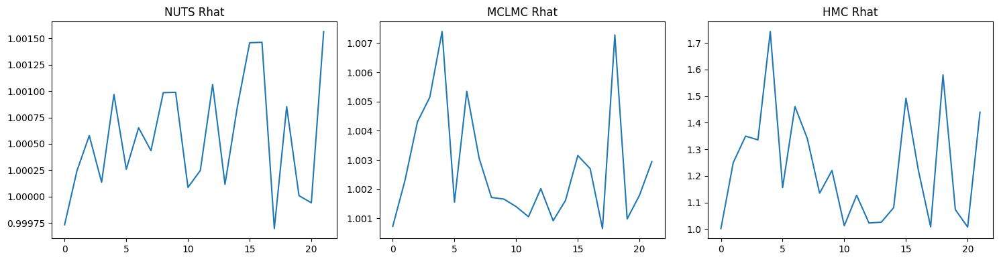

In [ ]:
ESS_hmc = blackjax.diagnostics.effective_sample_size(hmc_samples, chain_axis=1, sample_axis=0)
ESS_nuts = blackjax.diagnostics.effective_sample_size(nuts_samples, chain_axis=1, sample_axis=0)
ESS_mclmc = blackjax.diagnostics.effective_sample_size(mclmc_samples, chain_axis=1, sample_axis=0)

print("HMC: Mean ESS | Min ESS")
print(np.mean(ESS_hmc), " | ", jnp.min(ESS_hmc))
print("NUTS: Mean ESS | Min ESS")
print(np.mean(ESS_nuts), " | ", jnp.min(ESS_nuts))
print("MCLMC: Mean ESS | Min ESS")
print(np.mean(ESS_mclmc), " | ", jnp.min(ESS_mclmc))
Rhat_hmc = blackjax.diagnostics.potential_scale_reduction(hmc_samples, chain_axis=1, sample_axis=0)
Rhat_nuts = blackjax.diagnostics.potential_scale_reduction(nuts_samples, chain_axis=0, sample_axis=1)
Rhat_mclmc = blackjax.diagnostics.potential_scale_reduction(mclmc_samples, chain_axis=1, sample_axis=0)

print("HMC: Mean Rhat | Max Rhat")
print(np.mean(Rhat_hmc), " | ", jnp.max(Rhat_hmc))
print("NUTS: Mean Rhat | Max Rhat")
print(np.mean(Rhat_nuts), " | ", jnp.max(Rhat_nuts))
print("MCLMC: Mean Rhat | Max Rhat")
print(np.mean(Rhat_mclmc), " | ", jnp.max(Rhat_mclmc))

fig, axes = plt.subplots(1, 3, figsize=(15, 4))

axes[0].plot(Rhat_nuts)
axes[0].set_title("NUTS Rhat")
axes[1].plot(Rhat_mclmc)
axes[1].set_title("MCLMC Rhat")
axes[2].plot(Rhat_hmc.max(axis=0))
axes[2].set_title("HMC Rhat")
plt.tight_layout()
plt.show()

Physical samples shape: (8000, 22)
Number of labels: 22


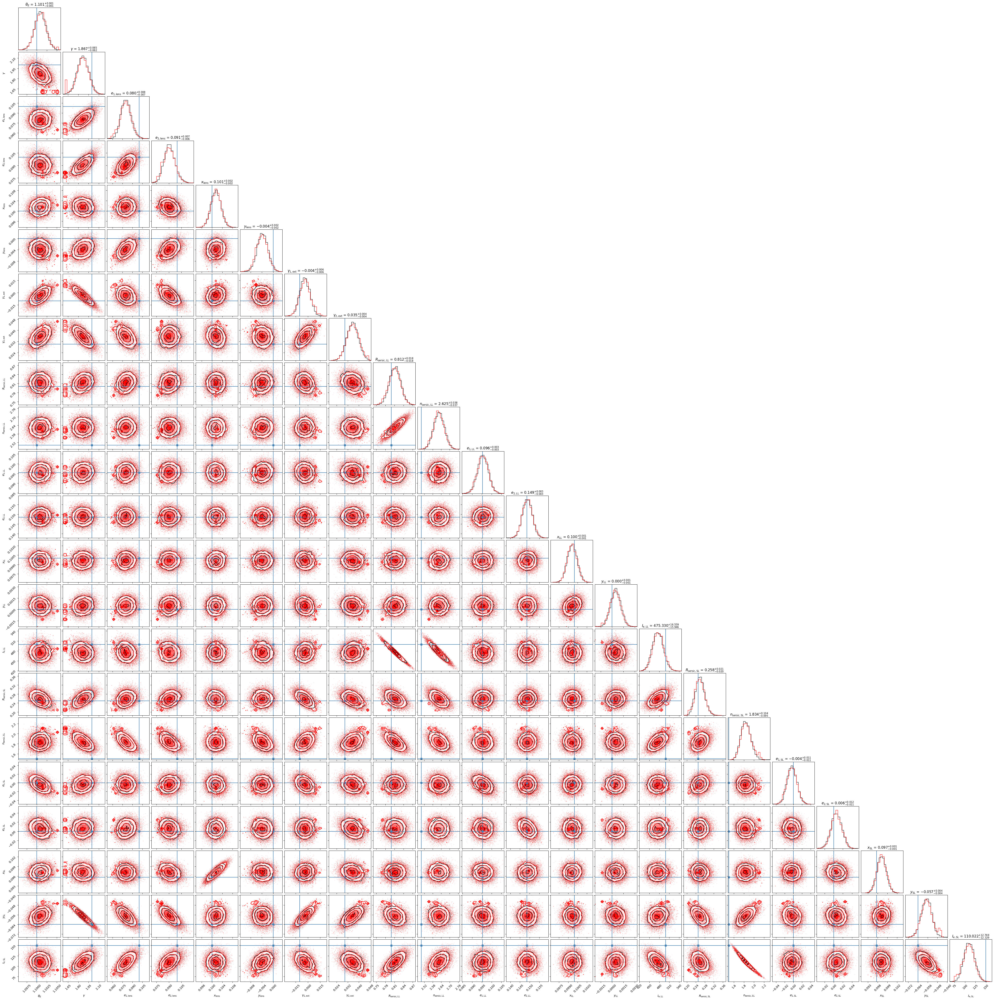

In [ ]:
import corner
import numpy as np
import jax.numpy as jnp

# Convert to constrained/physical space
smp = jnp.array(nuts_samples).reshape(-1, nuts_samples.shape[-1])  # (8000, 22)
smp_physical = prob_model.bij.forward(list(smp.T))  # Transform to physical space

# Collect all parameters in order
all_params = []

# Lens mass parameters
lens_mass_keys = ['theta_E', 'gamma', 'e1', 'e2', 'center_x', 'center_y']
for key in lens_mass_keys:
    all_params.append(np.array(smp_physical[0][0][key]))

# External shear
shear_keys = ['gamma1', 'gamma2']
for key in shear_keys:
    all_params.append(np.array(smp_physical[0][1][key]))

# Lens light parameters
lens_light_keys = ['R_sersic', 'n_sersic', 'e1', 'e2', 'center_x', 'center_y', 'Ie']
for key in lens_light_keys:
    all_params.append(np.array(smp_physical[1][0][key]))

# Source light parameters
source_light_keys = ['R_sersic', 'n_sersic', 'e1', 'e2', 'center_x', 'center_y', 'Ie']
for key in source_light_keys:
    all_params.append(np.array(smp_physical[2][0][key]))

# Stack into array
nuts_physical = np.stack(all_params).T  # (8000, 22)

# Labels
labels = [
    # Lens mass (8 params)
    r'$\theta_E$', r'$\gamma$', r'$e_{1,\rm lens}$', r'$e_{2,\rm lens}$', 
    r'$x_{\rm lens}$', r'$y_{\rm lens}$',
    r'$\gamma_{1,\rm ext}$', r'$\gamma_{2,\rm ext}$',
    # Lens light (7 params)
    r'$R_{\rm sersic,LL}$', r'$n_{\rm sersic,LL}$', 
    r'$e_{1,\rm LL}$', r'$e_{2,\rm LL}$',
    r'$x_{\rm LL}$', r'$y_{\rm LL}$', r'$I_{e,\rm LL}$',
    # Source light (7 params)
    r'$R_{\rm sersic,SL}$', r'$n_{\rm sersic,SL}$',
    r'$e_{1,\rm SL}$', r'$e_{2,\rm SL}$',
    r'$x_{\rm SL}$', r'$y_{\rm SL}$', r'$I_{e,\rm SL}$'
]

print(f"Physical samples shape: {nuts_physical.shape}")
print(f"Number of labels: {len(labels)}")

truth = [[
    {'theta_E': 1.1, 'gamma': 2.0, 'e1': 0.1, 'e2': 0.1, 'center_x': 0.1, 'center_y': 0.0},
    {'gamma1': -0.01, 'gamma2': 0.03}
], [
    {'R_sersic': 0.8, 'n_sersic': 2.5, 'e1': 0.09534746574143645, 'e2': 0.14849487967198177, 'center_x': 0.1, 'center_y': 0.0, 'Ie': 499.3695906504067}
], [
    {'R_sersic': 0.25, 'n_sersic': 1.5, 'e1': 0., 'e2': 0., 'center_x': 0.09566681002252231, 'center_y': -0.0639623054267272, 'Ie': 149.58828877085668}
]]

# Flatten truth in SAME order as labels
truth_values = []

# Lens mass
for key in lens_mass_keys:
    truth_values.append(truth[0][0][key])

# External shear
for key in shear_keys:
    truth_values.append(truth[0][1][key])

# Lens light
for key in lens_light_keys:
    truth_values.append(truth[1][0][key])

# Source light
for key in source_light_keys:
    truth_values.append(truth[2][0][key])

truth_values = np.array(truth_values)

# Reshape HMC samples
hmc_smp = jnp.array(hmc_samples).reshape(-1, hmc_samples.shape[-1])

# Transform to physical space
hmc_physical_struct = prob_model.bij.forward(list(hmc_smp.T))
hmc_all_params = []

# Lens mass
for key in lens_mass_keys:
    hmc_all_params.append(np.array(hmc_physical_struct[0][0][key]))

# External shear
for key in shear_keys:
    hmc_all_params.append(np.array(hmc_physical_struct[0][1][key]))

# Lens light
for key in lens_light_keys:
    hmc_all_params.append(np.array(hmc_physical_struct[1][0][key]))

# Source light
for key in source_light_keys:
    hmc_all_params.append(np.array(hmc_physical_struct[2][0][key]))

# Stack
hmc_physical = np.stack(hmc_all_params).T

fig = corner.corner(
    nuts_physical,
    labels=labels,
    truths=truth_values,
    show_titles=True,
    title_fmt='.3f',
    hist_kwargs={"density": True},
)

corner.corner(
    hmc_physical,
    fig=fig,
    color='red',
    hist_kwargs={"density": True},
)
fig.savefig('CORNER.png', dpi=150, bbox_inches='tight')
fig.show()